In [1]:
import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
import os
import statsmodels.api as sm
import itertools
from pylab import rcParams
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
os.chdir('C:\\Users\\wzh55\\Desktop\\GitHub\\Guzman-Energy\\data')
raw = pd.read_excel("Assignment 3 - timeseries_data.xlsx")

In [2]:
raw.shape #check the shape

(14987, 10)

In [3]:
raw.isnull().sum() #find missing values

DATETIME                       0
HB_NORTH (RTLMP)               0
ERCOT (WIND_RTI)               5
ERCOT (GENERATION_SOLAR_RT)    4
ERCOT (RTLOAD)                 0
HOURENDING                     0
MARKETDAY                      0
PEAKTYPE                       0
MONTH                          0
YEAR                           0
dtype: int64

In [4]:
df = raw.fillna(0) #fill missing values with 0

In [5]:
df.isnull().sum() #no issue here since we replace missing value with zero

DATETIME                       0
HB_NORTH (RTLMP)               0
ERCOT (WIND_RTI)               0
ERCOT (GENERATION_SOLAR_RT)    0
ERCOT (RTLOAD)                 0
HOURENDING                     0
MARKETDAY                      0
PEAKTYPE                       0
MONTH                          0
YEAR                           0
dtype: int64

In [6]:
pd.set_option("display.max_rows",df.shape[0]+1) #do this so that it will print all data

In [7]:
df

,DATETIME,HB_NORTH (RTLMP),ERCOT (WIND_RTI),ERCOT (GENERATION_SOLAR_RT),ERCOT (RTLOAD),HOURENDING,MARKETDAY,PEAKTYPE,MONTH,YEAR
0,2017-01-01 01:00:00,23.3575,2155.31,0.00,29485.791355,1,2017-01-01,OFFPEAK,JANUARY,2017
1,2017-01-01 02:00:00,21.4650,2313.81,0.00,28911.565913,2,2017-01-01,OFFPEAK,JANUARY,2017
2,2017-01-01 03:00:00,20.7350,2587.68,0.00,28238.258175,3,2017-01-01,OFFPEAK,JANUARY,2017
3,2017-01-01 04:00:00,20.2700,2748.65,0.00,27821.000513,4,2017-01-01,OFFPEAK,JANUARY,2017
4,2017-01-01 05:00:00,20.1200,2757.49,0.00,27646.942413,5,2017-01-01,OFFPEAK,JANUARY,2017
5,2017-01-01 06:00:00,19.7925,3032.06,0.00,27701.556228,6,2017-01-01,OFFPEAK,JANUARY,2017
6,2017-01-01 07:00:00,19.7225,3823.51,0.00,28244.390345,7,2017-01-01,WEPEAK,JANUARY,2017
7,2017-01-01 08:00:00,19.7375,4419.88,0.54,28955.926493,8,2017-01-01,WEPEAK,JANUARY,2017
8,2017-01-01 09:00:00,19.2625,6009.27,87.20,29623.127238,9,2017-01-01,WEPEAK,JANUARY,2017
9,2017-01-01 10:00:00,19.8625,5107.69,333.42,30677.852305,10,2017-01-01,WEPEAK,JANUARY,2017


In [8]:
%%capture #rename the column to make later data manipulation easier
df = df.rename(columns={"HB_NORTH (RTLMP)": "Price", "ERCOT (GENERATION_SOLAR_RT)": "Solar", "ERCOT (RTLOAD)":"Load", "ERCOT (WIND_RTI)":"Wind"})

In [9]:
df.groupby("HOURENDING").Price.describe() #Group by hour to examine price

,count,mean,std,min,25%,50%,75%,max
HOURENDING,,,,,,,,
1,625.0,18.668752,19.517385,-9.6625,16.650000,18.50000,19.965000,482.9050
2,626.0,16.915575,8.603190,-13.6075,15.797500,17.83250,19.465625,186.6150
3,623.0,15.991260,5.666084,-11.4800,15.145000,17.48500,19.076250,47.5425
4,625.0,15.774428,5.918094,-6.4375,15.425000,17.24250,18.862500,50.1150
5,625.0,16.514760,5.728702,-3.8125,15.720000,17.46750,19.067500,57.8900
6,625.0,18.829272,15.971143,-0.5500,16.480000,18.27500,19.692500,333.9725
7,625.0,28.629036,119.858810,-0.5550,17.490000,19.11250,20.677500,2809.3575
8,625.0,21.241200,22.648822,2.6950,17.890000,19.23500,20.947500,546.7475
9,625.0,21.762216,11.196358,10.4675,18.430000,19.80500,21.352500,196.5225


In [10]:
df.groupby("HOURENDING").Wind.describe()#Group by hour to examine wind

,count,mean,std,min,25%,50%,75%,max
HOURENDING,,,,,,,,
1,625.0,9197.391712,3881.156141,930.37,6035.0500,9504.840,12386.3000,20350.40
2,626.0,8950.465575,3882.114886,0.00,5708.5550,9192.755,12334.0800,16366.64
3,623.0,8749.345522,3840.994261,739.15,5566.7050,9123.620,11991.2400,16119.45
4,625.0,8476.049520,3837.776833,768.78,5239.5500,8851.100,11831.0700,15972.20
5,625.0,8185.846288,3840.344875,574.64,4846.1700,8576.260,11497.1400,15824.56
6,625.0,7910.895920,3855.406192,501.15,4429.8700,8231.030,11161.8900,15558.75
7,625.0,7697.309936,3889.737168,348.97,4315.1700,7691.020,10998.8000,15934.58
8,625.0,7417.014944,3858.745171,290.60,4067.9000,7463.670,10547.6600,15352.70
9,625.0,6843.874928,3843.135959,232.28,3639.5900,6755.570,9841.5200,15164.48


In [11]:
df.groupby("HOURENDING").Solar.describe()#Group by hour to examine solar

,count,mean,std,min,25%,50%,75%,max
HOURENDING,,,,,,,,
1,625.0,0.527440,5.572209,0.00,0.0000,0.000,0.1500,99.03
2,626.0,0.523818,5.567824,0.00,0.0000,0.000,0.1575,99.03
3,623.0,0.526051,5.581185,0.00,0.0000,0.000,0.1150,99.03
4,625.0,0.521360,5.550986,0.00,0.0000,0.000,0.1200,99.03
5,625.0,0.368368,3.803262,0.00,0.0000,0.000,0.1100,76.61
6,625.0,0.161696,0.555219,0.00,0.0000,0.000,0.1300,12.00
7,625.0,0.235168,0.571359,0.00,0.0000,0.060,0.3000,12.00
8,625.0,40.738256,50.473812,0.00,2.3500,18.140,68.5900,212.60
9,625.0,297.375328,206.537551,4.52,121.7900,265.870,427.2000,920.75


In [12]:
df.groupby("HOURENDING").Load.describe()#Group by hour to examine load

,count,mean,std,min,25%,50%,75%,max
HOURENDING,,,,,,,,
1,625.0,37440.974017,6693.685925,27590.749840,31428.957805,36088.280000,43394.516095,56507.743180
2,626.0,35698.901017,6213.935146,26312.063973,30098.779007,34450.524417,41025.727397,56307.763343
3,623.0,34579.047170,5844.449272,25722.452730,29228.212459,33561.860000,39279.229602,56505.087065
4,625.0,33943.856586,5582.437548,25566.511248,28956.175440,32955.406183,38450.203950,57134.809768
5,625.0,33974.466030,5423.531480,25569.673428,29241.473643,33030.828623,38361.752470,58563.558043
6,625.0,35076.103159,5366.546315,25802.365110,30752.603115,34334.818218,39085.418730,60947.047325
7,625.0,37271.394016,5424.004134,26478.519698,33332.958955,36518.146980,40734.743533,64274.796895
8,625.0,38548.998262,5471.132640,26921.824443,34934.613888,38013.712793,41905.082640,65729.935108
9,625.0,39594.885090,5488.820096,28305.342318,35628.647103,38852.625050,43531.530575,64836.436680


In [13]:
df.groupby("MONTH").Price.describe()#Group by month to examine price

,count,mean,std,min,25%,50%,75%,max
MONTH,,,,,,,,
APRIL,1440.0,22.362800,21.389208,-12.5300,17.412500,19.54875,21.946250,346.4075
AUGUST,1488.0,30.623269,47.663310,13.2175,19.381875,21.85625,30.117500,1105.3150
DECEMBER,744.0,21.780464,22.182619,0.7300,17.566875,19.01875,20.136875,406.0750
FEBRUARY,1344.0,21.464812,28.327432,-6.0600,17.010625,19.16250,20.750625,767.0775
JANUARY,1488.0,29.121223,82.060280,-13.6075,18.187500,20.53750,24.751250,2809.3575
JULY,1488.0,35.079696,72.939308,-0.5550,19.756250,23.92125,31.912500,1350.1875
JUNE,1440.0,27.586484,58.536840,12.3925,19.079375,21.41125,28.291875,2010.4625
MARCH,1486.0,19.112520,11.613502,-4.8025,16.033750,18.35375,19.976875,241.5875
MAY,1488.0,27.712991,41.756041,-17.8600,18.393750,21.03250,27.244375,955.7875


In [14]:
df.groupby("MONTH").Wind.describe()#Group by month to examine wind

,count,mean,std,min,25%,50%,75%,max
MONTH,,,,,,,,
APRIL,1440.0,9177.358021,3968.277625,580.01,5823.4975,9908.440,12451.8925,17177.43
AUGUST,1488.0,5963.577157,3457.624915,131.31,3250.9775,5372.465,8556.2225,15863.02
DECEMBER,744.0,6440.209745,3690.223112,219.82,3328.7300,6103.225,9004.2400,14433.50
FEBRUARY,1344.0,8117.666399,3662.083403,290.56,5144.5750,7849.170,10987.2075,17414.55
JANUARY,1488.0,7842.226169,4210.586733,745.97,4227.8375,7111.490,11682.4550,17242.18
JULY,1488.0,5647.755491,2945.495498,153.35,3366.1650,5455.060,7755.4450,14015.11
JUNE,1440.0,8155.146590,4318.001609,111.76,4301.7775,8740.025,11924.8875,16131.83
MARCH,1486.0,8909.721615,3817.211232,0.00,5943.3300,8965.340,12236.5775,20350.40
MAY,1488.0,8709.058152,4036.832038,476.99,5469.7125,9189.760,12014.3425,16476.96


In [15]:
df.groupby("MONTH").Solar.describe()#Group by month to examine solar

,count,mean,std,min,25%,50%,75%,max
MONTH,,,,,,,,
APRIL,1440.0,313.761389,376.508634,0.0,0.0000,72.675,649.1725,1216.64
AUGUST,1488.0,373.792735,428.292245,0.0,0.0000,88.530,774.8300,1249.52
DECEMBER,744.0,175.481102,272.240872,0.0,0.0000,0.600,304.8775,878.04
FEBRUARY,1344.0,198.659978,280.021927,0.0,0.0700,1.200,428.5075,1003.76
JANUARY,1488.0,177.944718,276.409632,0.0,0.0600,1.120,309.7850,961.96
JULY,1488.0,382.346371,420.645382,0.0,0.0000,133.095,751.7575,1244.09
JUNE,1440.0,382.376792,421.317280,0.0,0.0000,164.010,711.6575,1257.54
MARCH,1486.0,249.941555,318.922685,0.0,0.0525,7.350,517.6275,1027.47
MAY,1488.0,342.794617,389.355785,0.0,0.0000,134.645,685.0350,1242.66


In [16]:
df.groupby("MONTH").Load.describe()#Group by month to examine load

,count,mean,std,min,25%,50%,75%,max
MONTH,,,,,,,,
APRIL,1440.0,36087.714291,5360.335063,25566.511248,31754.882806,36165.666410,39855.097926,53426.363805
AUGUST,1488.0,50837.139060,9829.697846,29605.320890,42519.698478,49610.871378,59729.502522,69850.761233
DECEMBER,744.0,39248.482433,5017.142677,27623.850000,36358.782500,38906.268259,42232.928767,54483.712520
FEBRUARY,1344.0,36294.723797,5084.383987,26056.004280,33209.297322,36240.247717,39176.048197,55428.438373
JANUARY,1488.0,39369.814095,7708.063055,26819.410683,34760.391951,37473.670550,42491.672476,65729.935108
JULY,1488.0,52451.712435,9923.689227,34660.857568,43259.452305,52278.691314,61139.332343,73264.662123
JUNE,1440.0,49572.724289,9439.176456,31129.237923,41571.630901,48938.258601,57403.816985,69067.764153
MARCH,1486.0,35171.815092,4388.124936,26822.320875,31425.282697,35556.453520,38098.995379,47134.482508
MAY,1488.0,42976.220373,8720.980353,26003.570490,36143.172475,42235.473271,49099.793536,67203.667543


In [17]:
#From the data summary above, we can see price is highest around 16:00 - 17:00 and July - August.
#Wind is highest around 23:00 - 1:00 and March - April.
#Solar is higest around 14:00 - 15:00 and June - July.
#Load is highest around 17:00 - 18:00 and July - August.
#So we can say there is some linear relationship between load and price, which also makes intuitive sense.

corr = df.corr() #we can see the correlation between price and hour/year is pretty low
corr

,Price,Wind,Solar,Load,HOURENDING,YEAR
Price,1.000000,-0.151020,0.151931,0.238509,0.088126,0.064234
Wind,-0.151020,1.000000,-0.234881,-0.166484,-0.035084,0.125481
Solar,0.151931,-0.234881,1.000000,0.466339,0.179103,0.163079
Load,0.238509,-0.166484,0.466339,1.000000,0.424567,0.186099
HOURENDING,0.088126,-0.035084,0.179103,0.424567,1.000000,-0.000706
YEAR,0.064234,0.125481,0.163079,0.186099,-0.000706,1.000000


<AxesSubplot:>

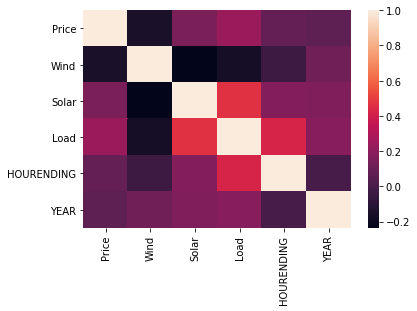

In [18]:
sns.heatmap(corr)

In [19]:
corr = df[["Price", "Wind", "Solar", "Load"]].corr() #as confirmed before, price has the highest correlation with load
corr

,Price,Wind,Solar,Load
Price,1.000000,-0.151020,0.151931,0.238509
Wind,-0.151020,1.000000,-0.234881,-0.166484
Solar,0.151931,-0.234881,1.000000,0.466339
Load,0.238509,-0.166484,0.466339,1.000000


<AxesSubplot:>

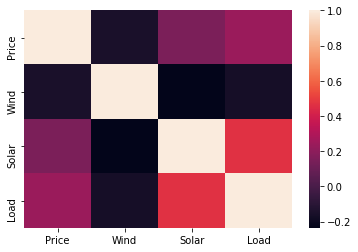

In [20]:
sns.heatmap(corr)

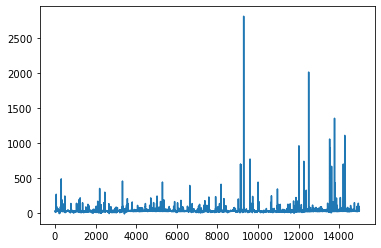

In [21]:
plt.plot(df.Price) #We can see there is some outliers, I get rid of those that is bigger than 

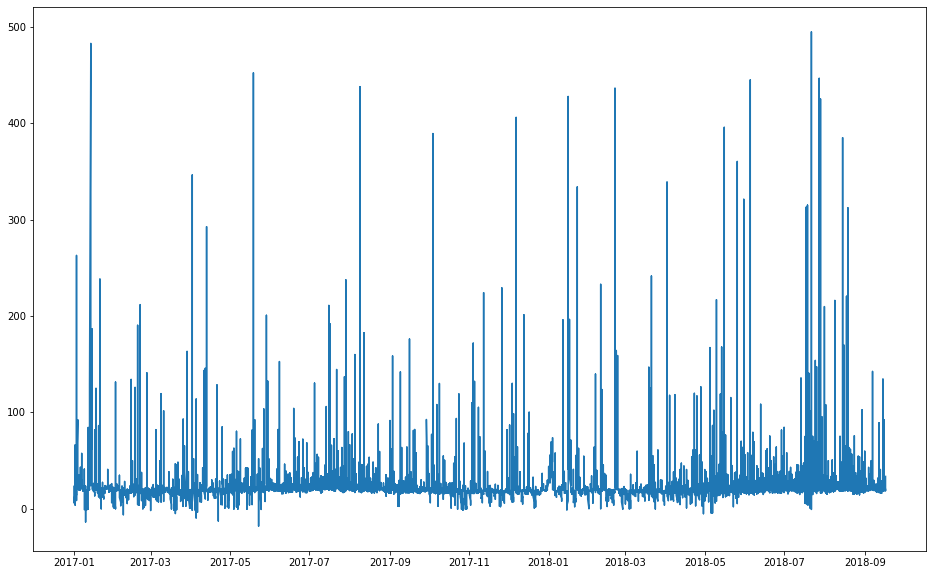

In [22]:
Filtered_Data = df[df.Price < 500]  #I only include price that is below 500
Filtered_Price = Filtered_Data[["Price"]]
Filtered_Date = Filtered_Data[["MARKETDAY"]]
plt.rcParams["figure.figsize"] = [16,10]
price_ts = plt.plot(Filtered_Date,Filtered_Price)

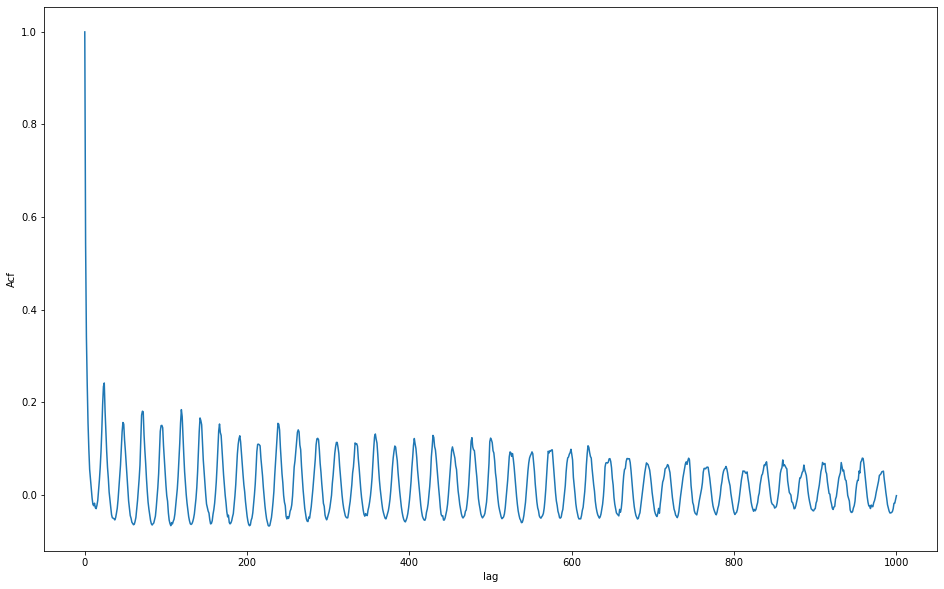

In [23]:
plt.plot(sm.tsa.stattools.acf(Filtered_Price, nlags=1000,fft=False)) #Below is ACF graph, we can clearly see there exist seasonality.
plt.xlabel("lag")
plt.ylabel("Acf")
plt.rcParams["figure.figsize"] = [16,25]
plt.show()

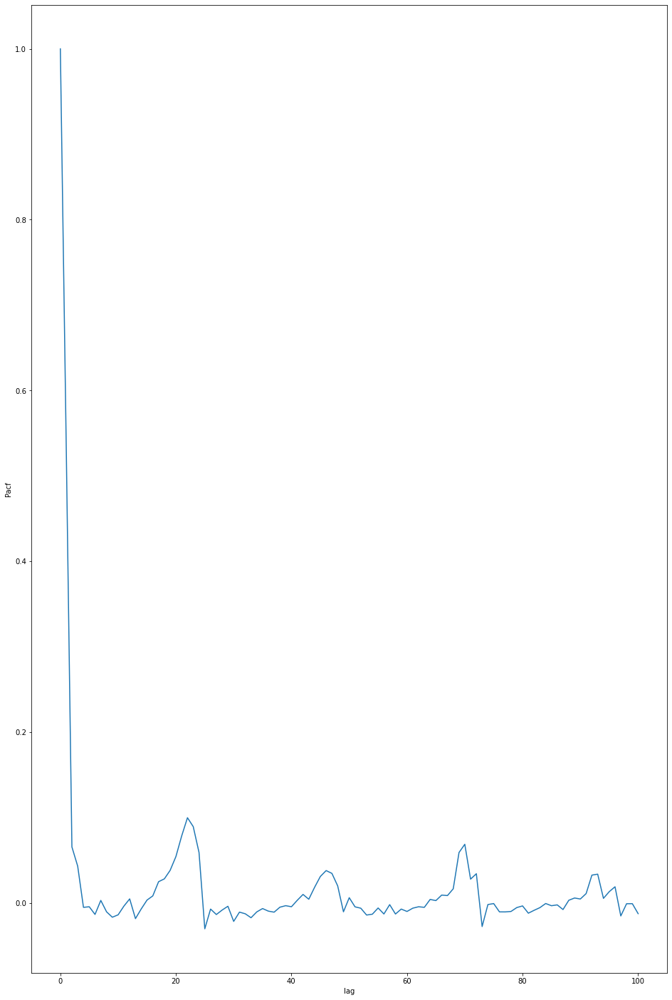

In [24]:
plt.plot(sm.tsa.stattools.pacf(Filtered_Price, nlags=100))#Below is PACF graph, we can clearly see there exist seasonality.
#Therefore, the process for price has both AR, MA and seasonality component.
plt.xlabel("lag")
plt.ylabel("Pacf")
plt.rcParams["figure.figsize"] = [16,25]
plt.show()

In [25]:
#Below is the AIC value for different permutation of AR,MA value. I select the model that has the smallest AIC value.
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 24) for x in list(itertools.product(p, d, q))]
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(Filtered_Price,order=param,seasonal_order=param_seasonal,enforce_stationarity=False,enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}24 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 24)24 - AIC:147498.34352131188
ARIMA(0, 0, 0)x(0, 0, 1, 24)24 - AIC:142627.82912969205
ARIMA(0, 0, 0)x(0, 1, 0, 24)24 - AIC:142057.60123913467
ARIMA(0, 0, 0)x(0, 1, 1, 24)24 - AIC:134180.83028865219
ARIMA(0, 0, 0)x(1, 0, 0, 24)24 - AIC:139178.4900771533
ARIMA(0, 0, 0)x(1, 0, 1, 24)24 - AIC:134371.73811196323
ARIMA(0, 0, 0)x(1, 1, 0, 24)24 - AIC:138624.94196039133
ARIMA(0, 0, 0)x(1, 1, 1, 24)24 - AIC:134059.60930524758
ARIMA(0, 0, 1)x(0, 0, 0, 24)24 - AIC:139501.84914455574
ARIMA(0, 0, 1)x(0, 0, 1, 24)24 - AIC:136944.3866001836
ARIMA(0, 0, 1)x(0, 1, 0, 24)24 - AIC:139401.54827194783
ARIMA(0, 0, 1)x(0, 1, 1, 24)24 - AIC:130972.1027401271
ARIMA(0, 0, 1)x(1, 0, 0, 24)24 - AIC:135389.1827372326
ARIMA(0, 0, 1)x(1, 0, 1, 24)24 - AIC:131160.88249175143
ARIMA(0, 0, 1)x(1, 1, 0, 24)24 - AIC:135719.89631577107
ARIMA(0, 0, 1)x(1, 1, 1, 24)24 - AIC:130903.42548234906
ARIMA(0, 1, 0)x(0, 0, 0, 24)24 - AIC:134682.23248483246
ARIMA(0, 1, 0)x(0, 0, 1, 24)24 - AIC:134412.22156604

In [28]:
mod = sm.tsa.statespace.SARIMAX(Filtered_Price,order=(1, 1, 1),seasonal_order=(1, 1, 1, 24)) #the smallest AIC value is order (1,1,1) and seasonal order (1,1,1,24)
results = mod.fit()
print(results.summary())

                                     SARIMAX Results                                      
Dep. Variable:                              Price   No. Observations:                14966
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 24)   Log Likelihood              -65098.088
Date:                            Thu, 06 May 2021   AIC                         130206.176
Time:                                    18:07:41   BIC                         130244.235
Sample:                                         0   HQIC                        130218.806
                                          - 14966                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4920      0.002    299.126      0.000       0.489       0.495
ma.L1         -0.9975      0.001  -

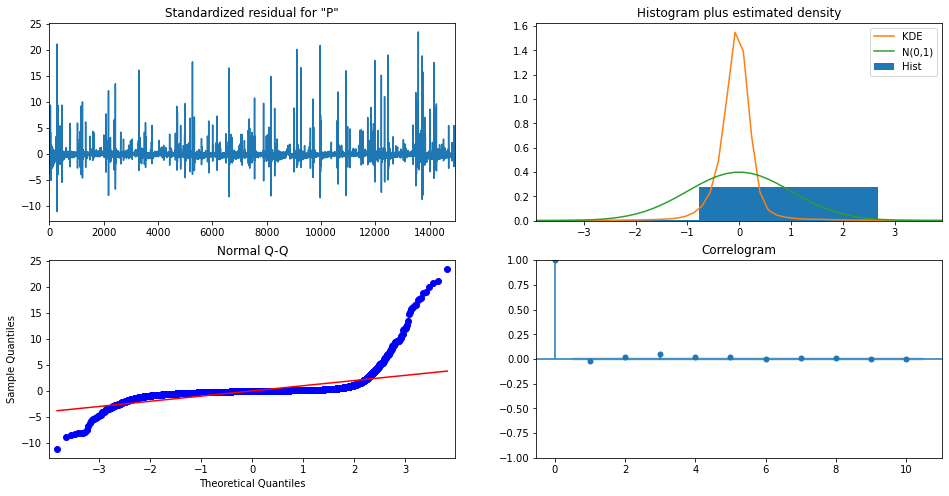

In [29]:
results.plot_diagnostics(figsize=(16, 8)) #it is nost perfect but it is suggested that the model residuals are near normally distributed.
plt.show()

In [125]:
#The orange diamond dot are forcasted value using one-step prediction
predict = results.get_prediction()
predict_ci = predict.conf_int()

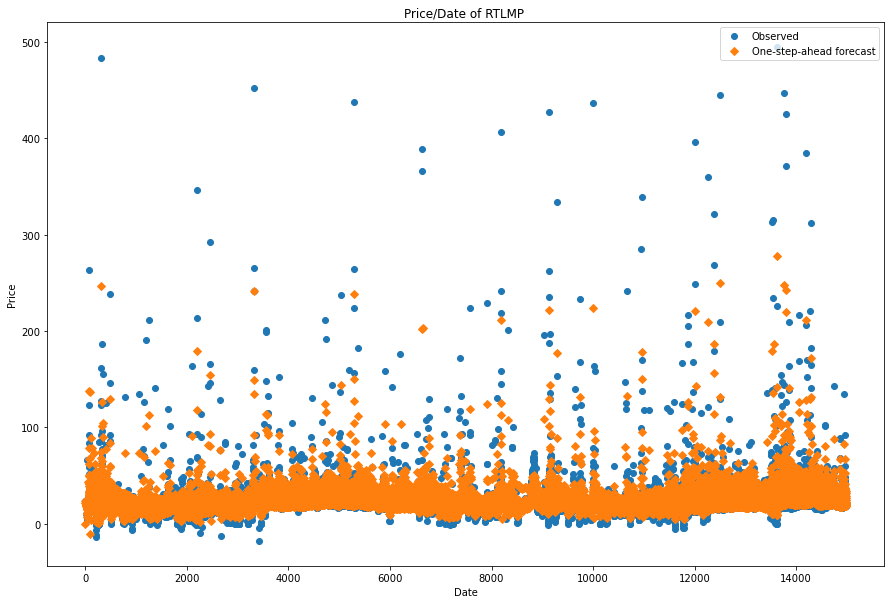

In [132]:
# Graph
fig, ax = plt.subplots(figsize=(15,10))
ax.set(title='Price/Date of RTLMP ', xlabel='Date', ylabel='Price')

# Plot data points
Filtered_Data["Price"].plot(ax=ax, style='o', label='Observed')

# Plot predictions
predict.predicted_mean.plot(ax=ax, style='D', label='One-step-ahead forecast')
legend = ax.legend(loc='upper right')